<a href="https://colab.research.google.com/github/AzulBarr/Aprendizaje-Automatico/blob/main/Copia_de_Clase_P7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, ConfusionMatrixDisplay
from transformers import BertTokenizer, BertModel
from datasets import load_dataset
import torch
from scipy.spatial.distance import cosine

# Configuramos un estilo para los gráficos
plt.style.use('seaborn-v0_8-whitegrid')

## 1. ¿Qué es la Tokenización?


Un **tokenizador** es una de las piezas fundamentales en el Procesamiento del Lenguaje Natural (NLP). Su trabajo es dividir el texto plano en unidades más pequeñas llamadas "tokens". Estas unidades son las que el modelo de lenguaje puede entender.

Si queremos que una computadora lea "Me gusta el fútbol". La computadora no entiende letras ni palabras, solo números. El tokenizador convierte esa frase en una secuencia de números que corresponden a una entrada en su vocabulario.

El tokenizador de BERT es especial: en lugar de separar solo por palabras, usa una técnica llamada **WordPiece**. Esto significa que si encuentra una palabra que no conoce, la descompone en sub-palabras que sí están en su vocabulario.

Ejemplo:

*   La palabra playing podría tokenizarse como ["play", "##ing"].
*   La palabra unhappily podría ser ["un", "##happy", "##ly"].


Esto le permite manejar un vocabulario casi infinito con un número finito de tokens.

In [ ]:
# Cargamos el tokenizador pre-entrenado multilingual
tokenizer = BertTokenizer.from_pretrained("bert-base-multilingual-cased")

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/996k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.96M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/625 [00:00<?, ?B/s]

In [ ]:
tokenizer

BertTokenizer(name_or_path='bert-base-multilingual-cased', vocab_size=119547, model_max_length=512, is_fast=False, padding_side='right', truncation_side='right', special_tokens={'unk_token': '[UNK]', 'sep_token': '[SEP]', 'pad_token': '[PAD]', 'cls_token': '[CLS]', 'mask_token': '[MASK]'}, clean_up_tokenization_spaces=True, added_tokens_decoder={
	0: AddedToken("[PAD]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	100: AddedToken("[UNK]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	101: AddedToken("[CLS]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	102: AddedToken("[SEP]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
	103: AddedToken("[MASK]", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
}
)

In [ ]:
texto = "Los árboles altos son hermosos."

# 1. Tokenización (divide en sub-palabras)
tokens = tokenizer.tokenize(texto)
print(f"Tokens: {tokens}")

Tokens: ['Los', 'árboles', 'altos', 'son', 'her', '##mos', '##os', '.']


In [ ]:
# 2. Conversión a IDs (mapea cada token a un número único)
input_ids = tokenizer.convert_tokens_to_ids(tokens)
print(f"IDs de los Tokens: {input_ids}")

IDs de los Tokens: [10182, 54851, 48198, 10312, 10485, 13386, 10310, 119]


In [ ]:
# El proceso completo con encode()
encoded_input = tokenizer(texto)
print(f"\nDiccionario completo del tokenizador: {encoded_input}")


Diccionario completo del tokenizador: {'input_ids': [101, 10630, 54851, 48198, 10312, 10485, 13386, 10310, 119, 102], 'token_type_ids': [0, 0, 0, 0, 0, 0, 0, 0, 0, 0], 'attention_mask': [1, 1, 1, 1, 1, 1, 1, 1, 1, 1]}


## 2. Introducción a la Tarea: Reconocimiento de Entidades Nombradas (NER)




El **Reconocimiento de Entidades Nombradas** (o NER, por sus siglas en inglés) es una de las tareas fundamentales en el Procesamiento de Lenguaje Natural. Su objetivo es simple: leer un texto, encontrar sustantivos propios (que llamamos "entidades") y clasificarlos en categorías predefinidas.

Por ejemplo, en la oración:

*"La sede de la ONU está en Nueva York y su secretario es António Guterres."*

Un modelo de NER identificaría:

- ONU: Organización (ORG)

- Nueva York: Lugar (LOC)

- António Guterres: Persona (PER)





Para nuestro notebook, vamos a simplificar la tarea a un problema binario y fácil de entender. En lugar de identificar múltiples tipos de entidades, nuestro modelo solo responderá a una pregunta para cada palabra:

**¿Esta palabra es parte del nombre de una persona?** (Sí / No)

Esto convierte el problema en una clasificación binaria, donde cada palabra recibirá una de dos etiquetas:

- `1`: Si es parte de una entidad de tipo PER.

- `0`: Para todo lo demás (personas, organizaciones, verbos, etc.).

In [ ]:
import datasets

dataset = datasets.load_dataset("xtreme", "PAN-X.es", split="train[:5000]")

README.md: 0.00B [00:00, ?B/s]

PAN-X.es/train-00000-of-00001.parquet:   0%|          | 0.00/744k [00:00<?, ?B/s]

PAN-X.es/validation-00000-of-00001.parqu(…):   0%|          | 0.00/372k [00:00<?, ?B/s]

PAN-X.es/test-00000-of-00001.parquet:   0%|          | 0.00/373k [00:00<?, ?B/s]

Generating train split:   0%|          | 0/20000 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/10000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/10000 [00:00<?, ? examples/s]

In [ ]:
dataset

{'tokens': ['REDIRECCIÓN', 'Algarrobo', '(', 'Chile', ')'],
 'ner_tags': [0, 5, 6, 6, 6],
 'langs': ['es', 'es', 'es', 'es', 'es']}

In [ ]:
ner_tags_feature = dataset.features['ner_tags'].feature
id2label = {i: label for i, label in enumerate(ner_tags_feature.names)}

print("\nMapeo de IDs a etiquetas NER:")
print(id2label)


Mapeo de IDs a etiquetas NER:
{0: 'O', 1: 'B-PER', 2: 'I-PER', 3: 'B-ORG', 4: 'I-ORG', 5: 'B-LOC', 6: 'I-LOC'}


Nos quedamos con las palabras que sean de tipo `PER`

In [ ]:
words = []
binary_labels = []

location_tag_ids = {1, 2}

for entry in dataset:
    for token, tag_id in zip(entry['tokens'], entry['ner_tags']):
        words.append(token)

        if tag_id in location_tag_ids:
            binary_labels.append(1) # Es un PER
        else:
            binary_labels.append(0) # No es un PER

In [ ]:
print(f"\nTotal de palabras procesadas: {len(words)}")
print(f"Ejemplos de palabras y sus etiquetas binarias:")

for i in range(200, 215):
    print(f"{words[i]:<15} -> {binary_labels[i]}")


Total de palabras procesadas: 32480
Ejemplos de palabras y sus etiquetas binarias:
Avenida         -> 0
Revolución      -> 0
(               -> 0
Tijuana         -> 0
)               -> 0
Paraná          -> 0
(               -> 0
247.310         -> 0
hab             -> 0
.               -> 0
REDIRECCIÓN     -> 0
Víctor          -> 1
González        -> 1
Reynoso         -> 1
REDIRECCIÓN     -> 0


### **2.1 Experimento con un Random Forest (Usando IDs de Tokens)**

In [ ]:
X_ids = []
y_labels = []

for word, label in zip(words, binary_labels):
    subword_ids = tokenizer(word, add_special_tokens=False)['input_ids']
    print(subword_ids)
    if subword_ids:
        # Si hay más de un sub-token, calculamos el promedio
        if len(subword_ids) > 1:
            # Calculamos la media y la redondeamos al entero más cercano
            average_id = int(np.mean(subword_ids))
            X_ids.append(average_id)
        else:
            # Si solo hay un token, simplemente lo añadimos
            X_ids.append(subword_ids[0])
        y_labels.append(label)

Se han truncado las últimas 5000 líneas del flujo de salida.
[119]
[18626]
[10192]
[10493]
[35847]
[10110]
[10125]
[28695]
[10104]
[10109]
[14856]
[10104]
[10442]
[117]
[14045, 58784]
[10183]
[10630]
[12233]
[56573]
[117]
[10173]
[10182]
[10121]
[12758]
[79639]
[10109]
[12895]
[10104]
[26319, 10343]
[119]
[12225, 10157]
[78401, 20898, 11599]
[12760]
[27549]
[66272, 21941]
[112]
[112, 112]
[99413]
[71204, 11037, 26461]
[112, 112]
[112]
[71033, 58730, 66014, 65622, 11281, 110919, 11537]
[15076]
[10104]
[39107, 10171]
[115, 11045]
[110829]
[10125]
[11316]
[28040]
[13069, 46692, 15675, 11042]
[119]
[27910]
[10104]
[14860]
[113]
[34594]
[114]
[10912]
[94637]
[11564]
[10183]
[42483]
[10104]
[31156, 23232, 13584]
[119]
[71033, 58730, 66014, 65622, 11281, 110919, 11537]
[10469]
[59340, 11039]
[113]
[10224]
[16837]
[114]
[10197, 10410, 10686]
[11316]
[28040]
[26166, 12333]
[10104]
[144, 11908, 31523]
[87944, 10836]
[10104]
[67478, 72865]
[71033, 58730, 66014, 65622, 11281, 110919, 11537]
[12760

In [ ]:
X_ids = np.array(X_ids).reshape(-1, 1) # Sklearn necesita un array 2D
y_labels = np.array(y_labels)

In [ ]:
y_labels

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
# Dividimos en datos de entrenamiento y prueba
X_train_ids, X_test_ids, y_train, y_test = train_test_split(X_ids, y_labels, test_size=0.3, random_state=42, stratify=y_labels)

print(f"Forma de los datos de entrenamiento (IDs): {X_train_ids.shape}")

Forma de los datos de entrenamiento (IDs): (22736, 1)


In [ ]:
# Entrenamos el modelo
rf_ids = RandomForestClassifier(random_state=42)
rf_ids.fit(X_train_ids, y_train)

RandomForestClassifier(random_state=42)


--- Resultados del Modelo con IDs de Tokens ---
              precision    recall  f1-score   support

           0       0.89      0.93      0.91      7974
           1       0.60      0.50      0.54      1770

    accuracy                           0.85      9744
   macro avg       0.75      0.71      0.73      9744
weighted avg       0.84      0.85      0.84      9744



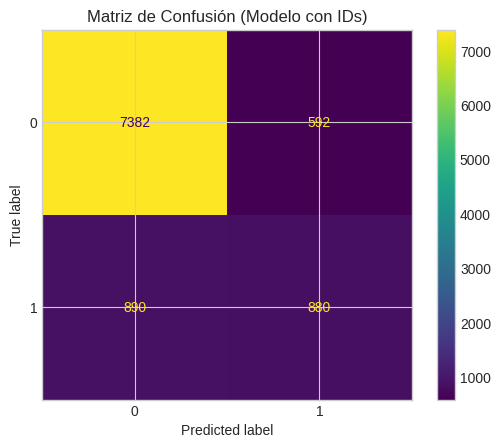

In [ ]:
# Evaluamos el rendimiento
print("\n--- Resultados del Modelo con IDs de Tokens ---")
print(classification_report(y_test, rf_ids.predict(X_test_ids)))

ConfusionMatrixDisplay.from_estimator(rf_ids, X_test_ids, y_test)
plt.title("Matriz de Confusión (Modelo con IDs)")
plt.show()

Los resultados del modelo tiene un rendimiento relativamente bajo. Esto se debe a que los IDs de los tokens son arbitrarios. El ID `5432` no guarda ninguna relación semántica o matemática con el `5433`. Son simplemente identificadores únicos. El modelo no puede generalizar porque los datos de entrada no contienen información sobre el significado de la palabra.

### 2.2 La Solución: Embeddings para dar Significado a los Tokens


**Introducimos el concepto de embeddings:** representaciones vectoriales (listas de números) que sí capturan el significado de las palabras. Palabras con significados similares tendrán vectores numéricamente cercanos.

BERT tiene una capa de embeddings pre-entrenada con millones de textos. Vamos a usar esos vectores.

Ahora repetiremos el experimento, pero en lugar de usar un simple ID, usaremos el vector de embedding de 768 dimensiones que BERT asigna a cada token.



In [ ]:
# Cargamos el modelo de BERT para acceder a su capa de embeddings

model = BertModel.from_pretrained("bert-base-multilingual-cased")
embeddings_matrix = model.get_input_embeddings().weight.detach().numpy()

model.safetensors:   0%|          | 0.00/714M [00:00<?, ?B/s]

In [ ]:
embeddings_matrix.shape

(119547, 768)

In [ ]:
X_embeddings = []
y_labels_final = []
for word, label in zip(words, binary_labels):
    subword_ids = tokenizer(word, add_special_tokens=False)['input_ids']
    subword_embeddings = embeddings_matrix[subword_ids]

    average_embedding = np.mean(subword_embeddings, axis=0)
    X_embeddings.append(average_embedding)
    y_labels_final.append(label)

In [ ]:
X_embeddings

[array([-4.24608123e-03,  4.67435317e-03, -6.36551008e-02, -1.32620260e-02,
        -3.56410444e-02, -2.73626167e-02, -1.23570943e-02, -2.13185996e-02,
         4.27113101e-03, -2.26326194e-02, -8.40159412e-03,  4.45053875e-02,
        -2.88050920e-02, -4.53142188e-02, -2.20773537e-02, -4.36666869e-02,
        -4.49314155e-02, -1.44644165e-02, -1.67818647e-02,  2.11569481e-02,
        -2.72466075e-02,  4.25972696e-03,  3.50241619e-03,  7.91754480e-03,
        -4.66795973e-02,  9.57891997e-03,  1.51006747e-02, -2.03200467e-02,
        -1.18438089e-02,  1.26558859e-02,  1.02078449e-02,  9.58715938e-03,
         3.09601557e-02,  3.15061747e-03,  1.34129096e-02,  1.59569252e-02,
         1.10694459e-02, -3.26974653e-02,  3.86182847e-03,  4.53544641e-03,
        -3.48194800e-02,  9.64403432e-03,  3.66966845e-03,  2.18621083e-02,
        -2.94496883e-02,  2.22780388e-02,  1.14762280e-02,  2.07362883e-02,
        -5.86199760e-03,  4.05384339e-02,  8.68054945e-03, -2.80237496e-02,
         1.9

In [ ]:
X_train_emb, X_test_emb, y_train_emb, y_test_emb = train_test_split(X_embeddings, y_labels_final, test_size=0.3, random_state=42, stratify=y_labels_final)

In [ ]:
# Entrenamos el nuevo modelo
rf_emb = RandomForestClassifier(random_state=42)
rf_emb.fit(X_train_emb, y_train_emb)

RandomForestClassifier(random_state=42)


--- Resultados del Modelo con Embeddings ---
              precision    recall  f1-score   support

           0       0.89      0.98      0.93      7974
           1       0.83      0.48      0.61      1770

    accuracy                           0.89      9744
   macro avg       0.86      0.73      0.77      9744
weighted avg       0.88      0.89      0.88      9744



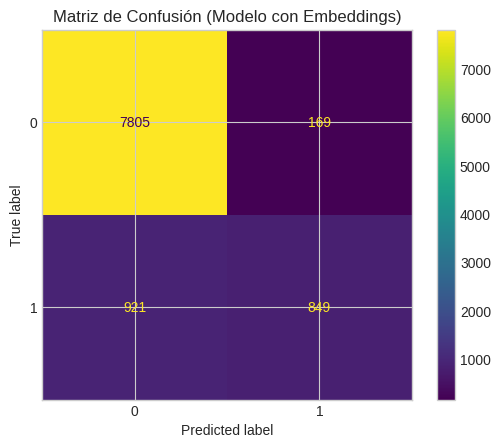

In [ ]:
# Evaluamos el rendimiento
print("\n--- Resultados del Modelo con Embeddings ---")
print(classification_report(y_test, rf_emb.predict(X_test_emb)))

ConfusionMatrixDisplay.from_estimator(rf_emb, X_test_emb, y_test_emb)
plt.title("Matriz de Confusión (Modelo con Embeddings)")
plt.show()

¡Ahora sí! Los resultados son mejores. El modelo ahora puede encontrar patrones porque los vectores de entrada contienen información semántica y gramatical. Los nombres de personas comparten ciertas características en sus 768 dimensiones que los diferencian de los sustantivos, verbos, etc.

## Explorando los embeddings

In [ ]:
def get_word_embedding(word, tokenizer):
    """Obtiene el embedding de una palabra promediando sus tokens."""
    # Tokeniza la palabra
    tokens = tokenizer.tokenize(word)
    if not tokens:
        return None

    # Obtiene los IDs de los tokens
    token_ids = tokenizer.convert_tokens_to_ids(tokens)

    # Busca los vectores de embedding para cada token y los promedia
    token_vectors = model.embeddings.word_embeddings.weight[token_ids].detach().numpy()

    # Si la palabra se divide en varios tokens, promediamos sus vectores
    return np.mean(token_vectors, axis=0)

In [ ]:
embedding_casa = get_word_embedding("casa", tokenizer)
print(f"Dimensiones del embedding para 'casa': {embedding_casa.shape}")

Dimensiones del embedding para 'casa': (768,)


**Función para encontrar las palabras más cercanas**

Ahora, creamos una función que toma una palabra, calcula su embedding y luego lo compara con todos los demás tokens del vocabulario para encontrar los más cercanos.



In [ ]:
def find_closest_words(word, tokenizer, top_n=10):
    """Encuentra las 'top_n' palabras más similares a una palabra dada."""
    # Obtenemos el vocabulario completo como una lista de tokens
    vocab = list(tokenizer.vocab.keys())

    # Calculamos el embedding de nuestra palabra de entrada
    word_embedding = get_word_embedding(word, tokenizer)
    if word_embedding is None:
        print(f"La palabra '{word}' no se pudo tokenizar.")
        return

    similarities = {}
    for vocab_word in vocab:
        # Evitamos sub-palabras y tokens especiales para tener resultados más limpios
        if vocab_word.startswith("##") or vocab_word.startswith("["):
            continue

        vocab_embedding = get_word_embedding(vocab_word, tokenizer)
        if vocab_embedding is not None:
            # Calculamos la similitud del coseno (1 - distancia del coseno)
            sim = 1 - cosine(word_embedding, vocab_embedding)
            similarities[vocab_word] = sim

    # Ordenamos las palabras por similitud y devolvemos las N mejores
    closest_words = sorted(similarities.items(), key=lambda item: item[1], reverse=True)

    return closest_words[1:top_n+1] # Excluimos la propia palabra


**¡Probando nuestro análisis!**

Veamos qué palabras considera BERT que están cerca de "casa", "rojo", "UBA" y "argentina".



In [ ]:
words_to_analyze = ["casa", "rojo", "UBA", "argentina"]

for word in words_to_analyze:
    print(f"\n--- Palabras más cercanas a '{word}' ---")
    closest = find_closest_words(word, tokenizer)
    if closest:
        for w, sim in closest:
            print(f"{w:<15} (Similitud: {sim:.4f})")


--- Palabras más cercanas a 'casa' ---
Casa            (Similitud: 0.5857)
maison          (Similitud: 0.5462)
casas           (Similitud: 0.4994)
дома            (Similitud: 0.3790)
house           (Similitud: 0.3726)
huis            (Similitud: 0.3652)
خانه            (Similitud: 0.3647)
maisons         (Similitud: 0.3622)
rumah           (Similitud: 0.3511)
kuće            (Similitud: 0.3504)

--- Palabras más cercanas a 'rojo' ---
amarillo        (Similitud: 0.6410)
vermelho        (Similitud: 0.5977)
rosso           (Similitud: 0.5377)
blanco          (Similitud: 0.5307)
Rojo            (Similitud: 0.5046)
roja            (Similitud: 0.4973)
rouge           (Similitud: 0.4814)
azul            (Similitud: 0.4664)
marrón          (Similitud: 0.4503)
bleu            (Similitud: 0.4359)

--- Palabras más cercanas a 'UBA' ---
BA              (Similitud: 0.3506)
UC              (Similitud: 0.3255)
HB              (Similitud: 0.3179)
BB              (Similitud: 0.3142)
AK              (

In [ ]:
words_to_analyze = ["Argentina"]

for word in words_to_analyze:
    print(f"\n--- Palabras más cercanas a '{word}' ---")
    closest = find_closest_words(word, tokenizer)
    if closest:
        for w, sim in closest:
            print(f"{w:<15} (Similitud: {sim:.4f})")


--- Palabras más cercanas a 'Argentina' ---
argentina       (Similitud: 0.6423)
Argentinien     (Similitud: 0.6389)
Arxentina       (Similitud: 0.6178)
Argentine       (Similitud: 0.6037)
Аргентина       (Similitud: 0.5623)
argentino       (Similitud: 0.5577)
Uruguay         (Similitud: 0.5449)
Bolivia         (Similitud: 0.5253)
Argentino       (Similitud: 0.5203)
Chile           (Similitud: 0.5135)
